In [6]:
!pip install rdflib
!pip install SPARQLWrapper
!pip install adjustText

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


In [1]:
import random
import warnings
warnings.filterwarnings('ignore')
import functools
import itertools
from typing import List, Sequence, Tuple

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import rdflib
from sklearn.manifold import TSNE
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.svm import SVC

import sys
sys.path.append('pyRDF2Vec')
sys.path.append('pyRDF2Vec/pyrdf2vec')

from pyrdf2vec import RDF2VecTransformer
from pyrdf2vec.graphs import KG
from pyrdf2vec.embedders import Word2Vec
from pyrdf2vec.walkers import (
    AnonymousWalker,
    CommunityWalker,
    HALKWalker,
    NGramWalker,
    RandomWalker,
    WalkletWalker,
    WLWalker,
)
from pyrdf2vec.samplers import (
    ObjPredFreqSampler,
    PredFreqSampler,
    UniformSampler,
    ObjFreqSampler,
    PageRankSampler,
)

import pickle

In [2]:
pip install pandas==1.3.0


Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 16.8 MB/s eta 0:00:0000:01
  Installing build dependencies ... -^C
anceled
Note: you may need to restart the kernel to use updated packages.


In [3]:
from pyrdf2vec.graphs import KG
import pandas as pd
# Load graph
view=2
view_name='VIEW'+str(view)
results = pd.DataFrame()

# Load graph
view_path='/home/khushboo/VIEW2/VIEW'+str(view)+"/"

nodes = pd.read_pickle(view_path+"nodes.pkl")
edges_df = pd.read_pickle(view_path+"edges.pkl")

In [4]:
nodes['name'] = nodes['name'].apply(lambda x: x.replace('<', '').replace('>', ''))


nodes

,name,type
0,http://purl.obolibrary.org/obo/SO_0000561,Sequence
1,http://purl.obolibrary.org/obo/HP_0033340,Phenotype
2,http://purl.obolibrary.org/obo/UBERON_0034713,Anatomy
3,http://www.ncbi.nlm.nih.gov/gene/57413,Gene
4,https://www.mirbase.org/mature/MIMAT0022474,miRNA
...,...,...
85294,http://purl.obolibrary.org/obo/HP_0012854,Phenotype
85295,http://purl.obolibrary.org/obo/HP_0031955,Phenotype
85296,http://purl.obolibrary.org/obo/HP_0006336,Phenotype
85297,http://purl.obolibrary.org/obo/MONDO_0700145,Disease


In [5]:
edges_df['subject'] = edges_df['subject'].apply(lambda x: x.replace('<', '').replace('>', ''))

edges_df['predicate'] = edges_df['predicate'].apply(lambda x: x.replace('<', '').replace('>', ''))
edges_df['object'] = edges_df['object'].apply(lambda x: x.replace('<', '').replace('>', ''))

In [7]:
edges_df

,subject,predicate,object,type
0,https://www.mirbase.org/mature/MIMAT0018099,http://purl.obolibrary.org/obo/RO_0002428,http://www.ncbi.nlm.nih.gov/gene/85463,Involved in regulation of
1,https://www.mirbase.org/mature/MIMAT0004774,http://purl.obolibrary.org/obo/RO_0002428,http://www.ncbi.nlm.nih.gov/gene/4856,Involved in regulation of
2,https://www.mirbase.org/mature/MIMAT0019073,http://purl.obolibrary.org/obo/RO_0002428,http://www.ncbi.nlm.nih.gov/gene/1292,Involved in regulation of
3,https://www.mirbase.org/mature/MIMAT0022470,http://purl.obolibrary.org/obo/RO_0002428,http://www.ncbi.nlm.nih.gov/gene/9886,Involved in regulation of
4,https://www.mirbase.org/mature/MIMAT0004953,http://purl.obolibrary.org/obo/RO_0002428,http://www.ncbi.nlm.nih.gov/gene/55806,Involved in regulation of
...,...,...,...,...
1149167,http://purl.obolibrary.org/obo/NCIT_C12736,http://purl.obolibrary.org/obo/NCIT_R81,http://purl.obolibrary.org/obo/NCIT_C12664,Anatomic_structure_has_location
1149168,http://purl.obolibrary.org/obo/UBERON_0001875,http://purl.obolibrary.org/obo/RO_0002225,http://purl.obolibrary.org/obo/UBERON_0001894,Develops from part of
1149169,http://purl.obolibrary.org/obo/CL_0000163,http://purl.obolibrary.org/obo/RO_0002339,http://purl.obolibrary.org/obo/UBERON_0001009,Has target end location
1149170,http://purl.obolibrary.org/obo/UBERON_0001131,http://purl.obolibrary.org/obo/RO_0002571,http://purl.obolibrary.org/obo/UBERON_0010913,Lumen of


In [8]:
entities= nodes['name']
sorted(entities)[:5]

['http://purl.obolibrary.org/obo/BFO_0000001',
 'http://purl.obolibrary.org/obo/CHEBI_10545',
 'http://purl.obolibrary.org/obo/CHEBI_11596',
 'http://purl.obolibrary.org/obo/CHEBI_11955',
 'http://purl.obolibrary.org/obo/CHEBI_12109']

In [9]:
len(entities)

85299

In [10]:
kg = KG('/home/khushboo/VIEW2/VIEW2/KG.nt')
kg

KG(location='/home/khushboo/VIEW2/VIEW2/KG.nt', skip_predicates=set(), literals=[], fmt=None, mul_req=False, skip_verify=False, cache=TTLCache({}, maxsize=1024, currsize=0), _is_remote=False)

In [11]:
list(kg._entities)[:5]

[Vertex(name='http://purl.obolibrary.org/obo/HP_0034538'),
 Vertex(name='http://purl.obolibrary.org/obo/HP_0010721'),
 Vertex(name='http://www.ncbi.nlm.nih.gov/gene/79647'),
 Vertex(name='http://purl.obolibrary.org/obo/GO_0051923'),
 Vertex(name='http://www.ncbi.nlm.nih.gov/gene/136895')]

In [12]:
len(kg._entities)

85299

In [13]:
from pyrdf2vec.graphs.vertex import Vertex
entities_vertex = []
for i in entities:
    entities_vertex.append(Vertex(name=i))
entities_vertex = set(entities_vertex)

In [14]:
len(entities_vertex)

85299

In [15]:
[e for e in entities_vertex if e not in kg._entities]

[]

In [16]:
filtered_entities = [e for e in entities_vertex if e not in kg._entities]
not_found = list(set(filtered_entities))
print(f'{not_found} could not be found in the KG! Removing them...')
entities_vertex = set(entities_vertex) - set(filtered_entities)

[] could not be found in the KG! Removing them...


In [17]:
new_entities = []
for i in entities_vertex:
    new_entities.append(i.name)

In [18]:
entities = new_entities

In [19]:
len(entities)

85299

In [20]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix

def classify(walk_embeddings):
  for task in ['type']:

    # Split our data into train and test (50/50 split)
    data = train_test_split(nodes['name'], nodes[task],
                            stratify=nodes[task], test_size=0.5,
                            random_state=42)
    train_ent, test_ent, y_train, y_test = data

    # Create masks that filter out all entities that are INCLUDED in the KG.
    train_mask = [x in entities for x in train_ent]
    test_mask = [x in entities for x in test_ent]
    y_train = y_train[train_mask]
    y_test = y_test[test_mask]

    # Create our X_train and X_test which consists out of the created embeddings
    X_train = []
    X_test = []
    for entity in train_ent:
      if entity in entities:
        X_train.append(walk_embeddings[entities.index(entity)])
    for entity in test_ent:
      if entity in entities:
        X_test.append(walk_embeddings[entities.index(entity)])
    X_train = np.array(X_train)
    X_test = np.array(X_test)

    # Fit a Random Forest & tune some of its hyper-parameters
    rf = GridSearchCV(RandomForestClassifier(random_state=42),
                      {'n_estimators': [10, 50, 100], 'max_depth': [3, 5, None]},
                      cv=10)
    rf.fit(X_train, y_train)
    preds = rf.predict(X_test)

    # Evaluate our model on the test data
    print(task)
    print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)
    print('Accuracy =', accuracy_score(y_test, preds))
    print(confusion_matrix(y_test, preds))
    print()

In [21]:
from pyrdf2vec.embedders import Word2Vec

In [22]:
transformer = RDF2VecTransformer(walkers=[RandomWalker(2,None)],embedder=Word2Vec(vector_size=500))

In [23]:
walk_embeddings = transformer.fit_transform(kg, entities)

In [24]:
walk_embeddings

([array([-9.5359271e-04, -8.1819075e-04, -3.0095307e-03, -7.0789861e-03,
         -1.1744408e-02, -2.6242007e-03,  1.1424359e-05, -3.5017291e-03,
          3.1683177e-03, -3.5514769e-03,  3.3358454e-03, -5.3826021e-03,
         -2.8177407e-03,  3.2085741e-03,  8.0733029e-03, -5.8656107e-03,
         -2.1354831e-03,  3.0897490e-03,  3.9157351e-03,  5.7414742e-03,
          3.3172697e-03,  6.0143215e-03,  6.3568372e-03,  5.6671114e-03,
          2.4234354e-03,  4.3285629e-03,  4.3662088e-03, -3.3378154e-03,
         -3.4935614e-03, -6.5439199e-03,  6.9722161e-04,  6.3343532e-04,
          3.1338648e-03,  6.2306214e-04, -1.2748223e-03,  4.8516230e-03,
          3.7655812e-03,  9.2256040e-04, -7.2296797e-03, -3.1404474e-04,
         -4.8395772e-03,  4.7126571e-03, -1.8163625e-04, -1.6729723e-03,
         -1.6809057e-03,  1.4481982e-03, -9.0482980e-03, -8.5606187e-04,
         -7.2759269e-03, -1.9873015e-04, -1.0539251e-03, -1.8705452e-03,
         -5.6750961e-03, -4.0375779e-04, -4.7086884

In [25]:
entity_embeddings = {entity: walk_embeddings[0][i] for i, entity in enumerate(entities)}

In [26]:
walk_embeddings_df = pd.DataFrame(entity_embeddings)


In [27]:
walk_embeddings_df

,http://purl.obolibrary.org/obo/HP_0034538,http://purl.obolibrary.org/obo/HP_0010721,http://www.ncbi.nlm.nih.gov/gene/79647,http://purl.obolibrary.org/obo/GO_0051923,http://www.ncbi.nlm.nih.gov/gene/136895,http://purl.obolibrary.org/obo/SO_0000642,http://purl.obolibrary.org/obo/UBERON_0016447,https://www.mirbase.org/mature/MIMAT0018089,http://purl.obolibrary.org/obo/HP_0001702,http://purl.obolibrary.org/obo/MONDO_0000919,...,http://purl.obolibrary.org/obo/CHEBI_17859,http://purl.obolibrary.org/obo/MONDO_0007898,http://purl.obolibrary.org/obo/GO_1902495,http://purl.obolibrary.org/obo/HP_0005274,http://purl.obolibrary.org/obo/MONDO_1010104,http://purl.obolibrary.org/obo/MONDO_0010184,http://www.ncbi.nlm.nih.gov/gene/64410,http://purl.obolibrary.org/obo/HP_0025166,http://purl.obolibrary.org/obo/HP_0012583,http://purl.obolibrary.org/obo/HP_0000307
0,-0.000954,-0.075814,-0.259835,-0.001549,-0.127120,-0.018259,-0.033792,-0.078474,0.148412,-0.056193,...,-0.057150,-0.012685,-0.041473,-0.037647,-0.028391,0.016497,-0.117364,-0.006003,-0.027514,-0.054963
1,-0.000818,-0.001281,0.269812,0.004063,0.134671,0.002204,0.008929,-0.255363,0.078099,0.045090,...,-0.004279,0.003524,0.017901,-0.012518,0.030523,-0.072193,0.094923,0.001940,0.009804,0.007939
2,-0.003010,-0.067335,0.163070,-0.005257,0.001327,-0.006408,-0.022932,0.130283,-0.191390,-0.034532,...,-0.162579,-0.006986,-0.059911,-0.020645,-0.020859,-0.024299,-0.008068,-0.011674,-0.025440,-0.128809
3,-0.007079,-0.045154,-0.158337,-0.004833,-0.110622,0.003928,-0.035187,0.208995,-0.125696,0.043666,...,-0.214626,-0.002183,-0.064736,-0.018243,-0.023565,-0.011308,-0.091309,-0.003517,-0.013727,-0.119304
4,-0.011744,-0.130220,-0.170290,-0.014701,-0.175419,-0.053100,-0.009730,0.129146,-0.296632,-0.128378,...,-0.139725,-0.016350,-0.147001,-0.038423,-0.110818,-0.043761,-0.158767,-0.016029,-0.051590,-0.257077
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,-0.003462,-0.038377,0.054778,-0.003338,-0.029481,-0.013001,-0.009226,0.004984,0.033333,0.055235,...,-0.141536,-0.010414,-0.031447,-0.013551,-0.019251,-0.103318,-0.025899,-0.001175,-0.012540,-0.088500
496,0.003038,0.031569,0.011695,0.000203,0.012464,0.025588,0.023236,-0.338621,0.155382,-0.004094,...,0.237370,-0.004332,0.002534,0.005565,0.012134,0.041459,0.007387,-0.002883,-0.000570,0.031798
497,0.000140,0.036769,-0.156254,-0.000192,-0.043425,-0.009852,-0.004684,0.097833,-0.044818,-0.076297,...,0.095449,0.004851,0.003435,0.018367,0.014225,-0.048998,-0.038047,0.009657,0.015372,0.056300
498,-0.002609,-0.051129,0.094098,-0.002930,0.000411,-0.003349,-0.014909,-0.059082,-0.260972,-0.004573,...,-0.270790,-0.007154,-0.049077,-0.012164,-0.023961,-0.032765,-0.014833,-0.009896,-0.022448,-0.125655


In [28]:
walk_embeddings_df.columns = walk_embeddings_df.iloc[0]
walk_embeddings_df = walk_embeddings_df[1:]

In [29]:
desired_dim =50
# Convert the dictionary 'data' into a pandas DataFrame
data = ()
df = pd.DataFrame(data)

# Set the index of the DataFrame
df.index = entities

# Flatten the first 'desired_dim' embedding vectors into separate columns
for i in range(desired_dim):
    df[f'{i}'] = [embedding[:desired_dim][i] for embedding in entity_embeddings.values()]


# Show the DataFrame
print(df)


                                                     0         1         2  \
http://purl.obolibrary.org/obo/HP_0034538    -0.000954 -0.000818 -0.003010   
http://purl.obolibrary.org/obo/HP_0010721    -0.075814 -0.001281 -0.067335   
http://www.ncbi.nlm.nih.gov/gene/79647       -0.259835  0.269812  0.163070   
http://purl.obolibrary.org/obo/GO_0051923    -0.001549  0.004063 -0.005257   
http://www.ncbi.nlm.nih.gov/gene/136895      -0.127120  0.134671  0.001327   
...                                                ...       ...       ...   
http://purl.obolibrary.org/obo/MONDO_0010184  0.016497 -0.072193 -0.024299   
http://www.ncbi.nlm.nih.gov/gene/64410       -0.117364  0.094923 -0.008068   
http://purl.obolibrary.org/obo/HP_0025166    -0.006003  0.001940 -0.011674   
http://purl.obolibrary.org/obo/HP_0012583    -0.027514  0.009804 -0.025440   
http://purl.obolibrary.org/obo/HP_0000307    -0.054963  0.007939 -0.128809   

                                                     3         

In [78]:
df.to_csv('view2_rdf2vec_embeddings.csv')


In [114]:
%matplotlib inline
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

def visualize(h, node_types):
    z = TSNE(n_components=2).fit_transform(h)

    plt.figure(figsize=(10,10))
    plt.xticks([])
    plt.yticks([])
    unique_node_types = np.unique(node_types)
    palette = sns.color_palette("tab20", len(unique_node_types))

    # Create a dictionary mapping each node type to a color
    node_type_to_color = {node_type: palette[i] for i, node_type in enumerate(unique_node_types)}

    # Map the colors for each node based on its type
    node_colors = [node_type_to_color[node_type] for node_type in node_types]
    scatter = plt.scatter(z[:, 0], z[:, 1], s=70, c=node_colors, cmap="tab20")




    # Create legend manually
    handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10)
               for color in palette]
    plt.legend(handles, unique_node_types, title="Node Types", loc='best')
    plt.show()

In [115]:
label_encoder = LabelEncoder()
node_types = label_encoder.fit_transform(list(nodes.type))

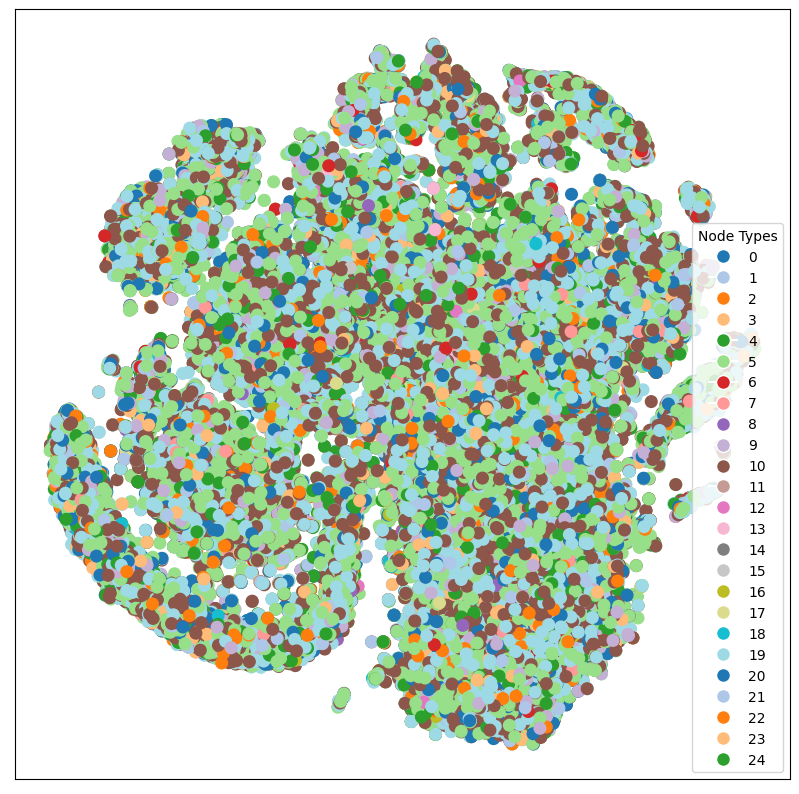

In [116]:
label_encoder = LabelEncoder()
nodes_type_encoded = label_encoder.fit_transform(nodes.type)

visualize(df, nodes_type_encoded)

In [117]:
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score

# Prepare the labels
true_labels = nodes['type']

In [118]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

# Prepare the features and labels
X = df.values
y = true_labels

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train a classifier
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

# Predict on the test set
y_pred = clf.predict(X_test)

In [119]:
# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

# Calculate precision and recall
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")

Accuracy: 0.2579
Precision: 0.1902
Recall: 0.2579


In [121]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

selected_classes = ['miRNA', 'Gene', 'Disease']

filtered_embeddings = []
filtered_labels = []


for class_label in selected_classes:

    class_indices = nodes[nodes['type'] == class_label].index


    class_embeddings = df.iloc[class_indices, 1:].values  # Skip the first column with identifiers

    # Append the filtered embeddings and labels
    filtered_embeddings.append(class_embeddings)
    filtered_labels.extend([class_label] * len(class_embeddings))


X_filtered = np.vstack(filtered_embeddings)

# Encode the labels
le = LabelEncoder()
y_filtered = le.fit_transform(filtered_labels)  # Convert the labels into numerical form


X_train, X_test, y_train, y_test = train_test_split(X_filtered, y_filtered, test_size=0.3, random_state=42)

clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

# Predict on the test set
y_pred = clf.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

# Calculate precision and recall
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")

precision_per_class = precision_score(y_test, y_pred, average=None, labels=np.unique(y_filtered))
recall_per_class = recall_score(y_test, y_pred, average=None, labels=np.unique(y_filtered))

for i, class_label in enumerate(le.classes_):
    if class_label in selected_classes:
        print(f"Class: {class_label}")
        print(f"  Precision: {precision_per_class[i]:.4f}")
        print(f"  Recall: {recall_per_class[i]:.4f}")


Accuracy: 0.4843
Precision: 0.4109
Recall: 0.4843
Class: Disease
  Precision: 0.5056
  Recall: 0.8028
Class: Gene
  Precision: 0.3980
  Recall: 0.2015
Class: miRNA
  Precision: 0.0000
  Recall: 0.0000


In [123]:
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

# Prepare the labels
true_labels = nodes['type']
X =  df.values

# Encode the labels
le = LabelEncoder()
y = le.fit_transform(true_labels)  # Convert the labels into numerical form

class_distribution = np.bincount(y)
print("Class distribution:", dict(zip(le.classes_, class_distribution)))

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train a classifier
clf = RandomForestClassifier(random_state=42,  class_weight='balanced')
clf.fit(X_train, y_train)

# Predict on the test set
y_pred = clf.predict(X_test)

# Calculate overall accuracy
accuracy = accuracy_score(y_test, y_pred)

# Calculate precision, recall, and f1-score for each class (node type)
precision = precision_score(y_test, y_pred, average=None)
recall = recall_score(y_test, y_pred, average=None)
f1 = f1_score(y_test, y_pred, average=None)

# Print the overall accuracy
print(f"Overall Accuracy: {accuracy:.4f}")

for i, class_label in enumerate(le.classes_):
    try:
        precision_class = precision_score(y_test, y_pred, labels=[i], average='macro')
        recall_class = recall_score(y_test, y_pred, labels=[i], average='macro')
        f1_class = f1_score(y_test, y_pred, labels=[i], average='macro')
        print(f"Class: {class_label}")
        print(f"  Precision: {precision[i]:.4f}")
        print(f"  Recall: {recall[i]:.4f}")
        print(f"  F1 Score: {f1[i]:.4f}")
    except IndexError:
        print(f"Class: {class_label}")
        print("  Precision: 0.0000 (No predictions for this class)")
        print("  Recall: 0.0000")
        print("  F1 Score: 0.0000")

Class distribution: {'Anatomy': 6129, 'Basic formal': 1, 'Cell': 1272, 'Chemical': 2000, 'Chromosome': 310, 'Disease': 23966, 'Environment': 446, 'Environmental exposure': 419, 'Food': 172, 'GO': 4071, 'Gene': 18341, 'General medical science': 6, 'Human developmental stage': 72, 'Medical action': 114, 'Mental disease': 12, 'Mental functioning': 14, 'Mouse pathology': 75, 'NCI thesaurus': 84, 'Neuro behaviour': 153, 'Phenotype': 18488, 'Protein': 205, 'Sequence': 2386, 'Species': 1766, 'Vaccine': 1, 'miRNA': 4796}
Overall Accuracy: 0.2594
Class: Anatomy
  Precision: 0.2400
  Recall: 0.0032
  F1 Score: 0.0064
Class: Basic formal
  Precision: 0.0000
  Recall: 0.0000
  F1 Score: 0.0000
Class: Cell
  Precision: 0.0000
  Recall: 0.0000
  F1 Score: 0.0000
Class: Chemical
  Precision: 0.0000
  Recall: 0.0000
  F1 Score: 0.0000
Class: Chromosome
  Precision: 0.2786
  Recall: 0.6735
  F1 Score: 0.3941
Class: Disease
  Precision: 0.0000
  Recall: 0.0000
  F1 Score: 0.0000
Class: Environment
  Pre

In [5]:
embeddings = pd.read_csv('/home/khushboo/view2_rdf2vec_embeddings.csv', header=None)

In [14]:
embeddings

,0,1,2,3,4,5,6,7,8,9,...,41,42,43,44,45,46,47,48,49,50
0,NaN,0.000000,1.000000,2.000000,3.000000,4.000000,5.000000,6.000000,7.000000,8.000000,...,40.000000,41.000000,42.000000,43.000000,44.000000,45.000000,46.000000,47.000000,48.000000,49.000000
1,http://purl.obolibrary.org/obo/HP_0025071,0.011300,0.024533,-0.011862,0.054858,-0.074466,-0.010650,-0.019114,-0.005212,-0.017386,...,0.026166,0.027150,-0.025000,0.011470,-0.024369,-0.004345,-0.011377,-0.021075,0.030918,-0.036066
2,http://purl.obolibrary.org/obo/HP_0004404,0.150474,0.010817,-0.014696,0.068032,-0.214304,0.027459,-0.091473,-0.027566,-0.006995,...,0.043074,0.084708,-0.044124,-0.063637,-0.056549,-0.017165,-0.001079,-0.061822,0.106248,-0.086659
3,http://purl.obolibrary.org/obo/HP_0025050,0.007353,0.011074,-0.003098,0.015721,-0.020366,-0.000035,-0.008122,0.002379,-0.004175,...,0.005308,0.007815,-0.002812,0.002402,-0.009612,0.000500,-0.000710,-0.004973,0.010148,-0.008845
4,http://purl.obolibrary.org/obo/MONDO_0013782,-0.238218,0.410732,-0.273427,0.119477,0.288317,0.084314,-0.061675,-0.142635,0.001539,...,-0.076425,-0.243656,0.016243,0.046415,-0.298589,-0.023901,-0.249151,-0.043728,0.311657,0.015170
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84856,http://www.ncbi.nlm.nih.gov/gene/768212,0.004442,0.012013,0.004514,0.005525,-0.016277,0.003468,-0.001198,-0.003688,-0.007731,...,0.012730,-0.005170,-0.007306,0.011175,-0.006780,-0.000863,0.000854,-0.002231,-0.003135,-0.012377
84857,http://purl.obolibrary.org/obo/UBERON_0003592,0.018741,0.028172,-0.001490,0.054971,-0.182994,-0.067734,-0.033897,-0.046199,-0.055075,...,-0.014870,0.013532,-0.047694,-0.006798,-0.009327,-0.058161,0.022939,-0.023094,0.025646,-0.066169
84858,http://purl.obolibrary.org/obo/MONDO_0007132,0.000716,0.004010,0.007867,0.006759,0.000601,0.001283,-0.001606,-0.004478,-0.003208,...,0.001973,-0.001946,-0.005015,0.005566,0.001696,-0.001216,-0.005524,-0.009388,0.003872,0.000832
84859,http://www.ncbi.nlm.nih.gov/gene/2275,0.051655,-0.100780,0.005463,-0.010125,-0.227533,-0.122995,-0.066546,-0.043827,-0.196714,...,-0.006236,0.079593,-0.201606,-0.035109,-0.049604,-0.066361,0.120544,-0.055090,0.124799,-0.091112


In [6]:
# basics
import numpy as np
import pandas as pd
import tensorflow as tf

# math
from math import ceil
from math import log
from math import log10

# utils
import itertools as it
import time
#from varname import nameof # get the name of a variable
import pickle
from tqdm.auto import tqdm, trange
#from tqdm import tqdm  RuntimeError: CUDA error: device-side assert triggered
import inspect
from grape.datasets.linqs import get_words_data # words information is excluded
from sklearn.preprocessing import LabelEncoder


# plot
import matplotlib as mpl
import matplotlib.pyplot as plt
import tikzplotlib
#from barplots import barplots
import matplotlib.colors as colors
import seaborn as sns
from sklearn.manifold import TSNE


# torch geometrics
import torch
import torch.optim as optim

from torch_geometric.datasets import FB15k_237
from torch_geometric.nn import ComplEx, DistMult, RotatE, TransE
from torch_geometric.data import Data

import os.path as osp

# Convolutional GNN
import torch_geometric.transforms as T

from torch_geometric.datasets import Planetoid
from torch_geometric.nn import GCNConv
from torch_geometric.utils import negative_sampling
from torch_geometric.loader import LinkNeighborLoader
from torch_geometric.transforms import RandomLinkSplit

from sklearn.metrics import roc_auc_score
# # Grape

2024-09-20 07:43:46.625480: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-09-20 07:43:46.667732: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-09-20 07:43:47.342702: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [7]:
# # Grape
# from grape.datasets import get_all_available_graphs_dataframe
# from grape.datasets import get_dataset
from grape import Graph
from grape import GraphVisualizer

# # Ensmallen
# from grape.embedders import Node2VecCBOWEnsmallen, Node2VecGloVeEnsmallen, Node2VecSkipGramEnsmallen
# from grape.embedders import DeepWalkCBOWEnsmallen, DeepWalkGloVeEnsmallen, DeepWalkSkipGramEnsmallen
# from grape.embedders import WalkletsSkipGramEnsmallen, WalkletsCBOWEnsmallen, WalkletsGloVeEnsmallen
# from grape.embedders import FirstOrderLINEEnsmallen, SecondOrderLINEEnsmallen
# #from grape.embedders import NetMFEnsmallen, GLEEEnsmallen, HOPEEnsmallen
from grape.embedders import TransEEnsmallen

# # TensorFlow
# from grape.embedders import SkipGramTensorFlow, CBOWTensorFlow
# from grape.embedders import FirstOrderLINETensorFlow, SecondOrderLINETensorFlow

# # KarateClub
# from grape.embedders import Role2VecKarateClub, GraRepKarateClub
# from grape.embedders import NMFADMMKarateClub, RandNEKarateClub


# # Edge prediction evaluation
from grape.edge_prediction import edge_prediction_evaluation
from grape.edge_prediction import DecisionTreeEdgePrediction, RandomForestEdgePrediction, ExtraTreesEdgePrediction, MLPEdgePrediction, GradientBoostingEdgePrediction,PerceptronEdgePrediction

# from grape.edge_prediction import KipfGCNEdgePrediction

# # Node Label prediction evaluation
# from grape.node_label_prediction import node_label_prediction_evaluation
# from grape.node_label_prediction import DecisionTreeNodeLabelPrediction, RandomForestNodeLabelPrediction, MLPNodeLabelPrediction, GradientBoostingNodeLabelPrediction#, PerceptronNodeLabelPrediction

In [8]:
# IMPORT METHODS

# One-hot encoding of the types
class TypeOneHotEncoder:
    def __init__(self, sep='|'):
        self.sep = sep

    def __call__(self, df):
        types = set(g for col in df.values for g in col.split(self.sep))
        mapping = {type: i for i, type in enumerate(types)}

        x = torch.zeros(len(df), len(mapping))
        for i, col in enumerate(df.values):
            for type in col.split(self.sep):
                x[i, mapping[type]] = 1
        return x

# Integer encoding for types
class TypeIntegerEncoder:
    def __init__(self, sep='|'):
        self.sep = sep

    def __call__(self, df):
        types = set(g for col in df.values for g in col.split(self.sep))
        mapping = {type: i for i, type in enumerate(types)}

        x = torch.zeros(len(df), 1)
        for i, type in enumerate(df.values):
                x[i] = mapping[type]
        return x.to(torch.float)

In [10]:
def load_node_df(df, index_col, encoders=None, **kwargs):

    # Integer encoding for the types
    type_mapping: Dict[str, int] = {}

    df = df.set_index(index_col)
    # Create te mapping for the index
    mapping = {index: i for i, index in enumerate(df.index.unique())}

    # Create the features for the nodes
    x = None
    if encoders is not None:
        xs = [encoder(df[col]) for col, encoder in encoders.items()]
        x = torch.cat(xs, dim=-1)

    return x, mapping

def load_edge_df(df, src_index_col, src_mapping, dst_index_col, dst_mapping,
                 pred_index_col=None, pred_mapping=None, encoders=None, **kwargs):

    src = [src_mapping[index] for index in df[src_index_col]]
    dst = [dst_mapping[index] for index in df[dst_index_col]]
    edge_index = torch.tensor([src, dst])

    # Edge Types
    edge_attr = None
    # Edge mapping
    if pred_mapping is not None:
        edge_attrs = torch.zeros(len(df), 1)
        for i, type in enumerate(df[pred_index_col].values):
            edge_attrs[i] = pred_mapping[type]
        edge_attr = edge_attrs.to(torch.int64)
    # No mapping but encoder
    if encoders is not None:
        edge_attrs = [encoder(df[col]) for col, encoder in encoders.items()]
        edge_attr = torch.cat(edge_attrs, dim=-1)

    return edge_index, edge_attr

In [30]:
from grape import Graph # type: ignore
rna_kg_graph = Graph.from_pd(
    edges_df=edges_df,
    nodes_df=nodes,
    node_name_column="name",
    node_type_column="type",
    edge_src_column="subject",
    edge_dst_column="object",
    #edge_weight_column="weight",
    edge_type_column="type",
    node_types_separator="|",
    directed=False,
    name=view_name,
)

rna_kg_graph_directed = Graph.from_pd(
    edges_df=edges_df,
    nodes_df=nodes,
    node_name_column="name",
    node_type_column="type",
    edge_src_column="subject",
    edge_dst_column="object",
    #edge_weight_column="weight",
    edge_type_column="type",
    node_types_separator="|",
    directed=True,
    name=view_name+"_directed",
)

2024-10-29 21:03:01.662813: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-10-29 21:03:01.711469: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-10-29 21:03:07.960325: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [31]:
graph = rna_kg_graph_directed
# Function to simplify node names
def simplify_node_names(graph):
    simplified_node_names = [name[0] for name in graph.get_node_names()]
    return simplified_node_names

# Apply to the graph
simplified_node_names = simplify_node_names(graph)

In [37]:
evaluation = edge_prediction_evaluation(
    holdouts_kwargs=dict(train_size=0.8),
    graphs=graph,
    models=[RandomForestEdgePrediction()],
    number_of_holdouts=5,
    node_features=df.values,  # Use simplified embedding features
    smoke_test=False,
    enable_cache=False
)

In [38]:
results = pd.concat([results, evaluation], ignore_index = True)
filename = "results_"+view_name+"_FirstOrderLINE_rdf2vec.csv"
results.to_csv(filename)

In [137]:
results

,evaluation_mode,train_size,validation_unbalance_rate,use_scale_free_distribution,diagnostic_odds_ratio,negative_predictive_value,false_discovery_rate,positive_likelyhood_ratio,informedness,negative_likelyhood_ratio,...,"(model_parameters, max_features)","(model_parameters, max_leaf_nodes)","(model_parameters, min_impurity_decrease)","(model_parameters, bootstrap)","(model_parameters, oob_score)","(model_parameters, n_jobs)","(model_parameters, verbose)","(model_parameters, warm_start)","(model_parameters, ccp_alpha)","(model_parameters, max_samples)"
0,train,0.8,1.0,True,1.077819,0.500047,0.481321,1.077617,0.000187,0.999812,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None
1,test,0.8,1.0,True,1.046756,0.500027,0.488605,1.046642,0.000109,0.999891,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None
2,train,0.8,1.0,True,1.127217,0.500068,0.470165,1.126911,0.000271,0.999729,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None
3,test,0.8,1.0,True,1.096454,0.500050,0.477046,1.096234,0.000200,0.999799,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None
4,train,0.8,1.0,True,1.334484,0.500091,0.428450,1.333996,0.000365,0.999634,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None
5,test,0.8,1.0,True,1.123023,0.500032,0.471058,1.122881,0.000126,0.999874,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None
6,train,0.8,1.0,True,1.034159,0.500034,0.491637,1.034019,0.000135,0.999865,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None
7,test,0.8,1.0,True,1.002176,0.500002,0.499459,1.002167,0.000009,0.999991,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None
8,train,0.8,1.0,True,1.043940,0.500031,0.489282,1.043810,0.000125,0.999875,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None
9,test,0.8,1.0,True,1.066470,0.500048,0.483965,1.066265,0.000191,0.999808,...,sqrt,None,0.0,True,False,-1,False,False,0.0,None


In [33]:
from grape.edge_prediction import edge_prediction_evaluation
from grape.edge_prediction import DecisionTreeEdgePrediction, RandomForestEdgePrediction, ExtraTreesEdgePrediction, MLPEdgePrediction, GradientBoostingEdgePrediction,PerceptronEdgePrediction


In [35]:
evaluation = edge_prediction_evaluation(
    holdouts_kwargs=dict(train_size=0.8),
    graphs=graph,
    models=[DecisionTreeEdgePrediction()],
    number_of_holdouts=5,
    node_features=df.values,  # Use simplified embedding features
    smoke_test=False
)


In [36]:
results = evaluation
filename = "results_"+view_name+"_FirstOrderLINE_DesicionTree_rdf2vec.csv"
results.to_csv(filename)

In [37]:
# Separate train and test results
train_results = evaluation[evaluation['evaluation_mode'] == 'train']
test_results = evaluation[evaluation['evaluation_mode'] == 'test']

# Function to compute mean metrics for a given evaluation mode
def compute_mean_metrics(data):
    results = []
    for holdout in data['holdout_number'].unique():
        holdout_data = data[data['holdout_number'] == holdout]

        # Calculate mean values for metrics
        auc_score = holdout_data['auroc'].mean()
        precision = holdout_data['precision'].mean()
        recall = holdout_data['recall'].mean()
        f1_score = holdout_data['f1_score'].mean()
        accuracy = holdout_data['accuracy'].mean()  # Assuming 'accuracy' column exists

        # Append results for this holdout
        results.append({
            'Holdout': holdout,
            'AUC': auc_score,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1_score,
            'Accuracy': accuracy
        })

    # Convert to DataFrame
    return pd.DataFrame(results)

# Compute metrics for train and test
train_metrics_df = compute_mean_metrics(train_results)
test_metrics_df = compute_mean_metrics(test_results)

# Calculate overall mean for train and test
overall_train_mean = train_metrics_df.mean(numeric_only=True)
overall_test_mean = test_metrics_df.mean(numeric_only=True)

# Create a summary DataFrame
summary_df = pd.DataFrame({
    'Evaluation Mode': ['Train', 'Test'],
    'AUC': [overall_train_mean['AUC'], overall_test_mean['AUC']],
    'Precision': [overall_train_mean['Precision'], overall_test_mean['Precision']],
    'Recall': [overall_train_mean['Recall'], overall_test_mean['Recall']],
    'F1 Score': [overall_train_mean['F1 Score'], overall_test_mean['F1 Score']],
    'Accuracy': [overall_train_mean['Accuracy'], overall_test_mean['Accuracy']]
})

# Display the summary of mean metrics
print(summary_df)


  Evaluation Mode       AUC  Precision    Recall  F1 Score  Accuracy
0           Train  0.497271   0.499794  0.193643  0.258088  0.499859
1            Test  0.496728   0.499641  0.193649  0.258171  0.499813


In [38]:
test_results = evaluation[evaluation['evaluation_mode'] == 'test']

# Check if the filtering worked
print(test_results)

# List to store metrics for plotting
results = []

# Loop through each holdout for test results
for holdout in test_results['holdout_number'].unique():
    # Extract metrics for this holdout
    holdout_data = test_results[test_results['holdout_number'] == holdout]
    
    # Calculate mean values for the metrics
    auc_score = holdout_data['auroc'].mean()
    precision = holdout_data['precision'].mean()
    recall = holdout_data['recall'].mean()
    f1_score = holdout_data['f1_score'].mean()

    # Append results for this holdout
    results.append({
        'Holdout': holdout,
        'AUC': auc_score,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1_score
    })

# Create a DataFrame to summarize the filtered test results
results_df = pd.DataFrame(results)

# Print the results for test mode
print(results_df)

  evaluation_mode  train_size  validation_unbalance_rate  \
1            test         0.8                        1.0   
1            test         0.8                        1.0   
1            test         0.8                        1.0   
1            test         0.8                        1.0   
1            test         0.8                        1.0   

   use_scale_free_distribution  false_discovery_rate  precision  \
1                         True              0.501849   0.498151   
1                         True              0.498083   0.501917   
1                         True              0.499394   0.500606   
1                         True              0.498626   0.501374   
1                         True              0.503845   0.496155   

   negative_predictive_value  positive_likelyhood_ratio  \
1                   0.498595                   0.992631   
1                   0.500382                   1.007697   
1                   0.500061                   1.002427   


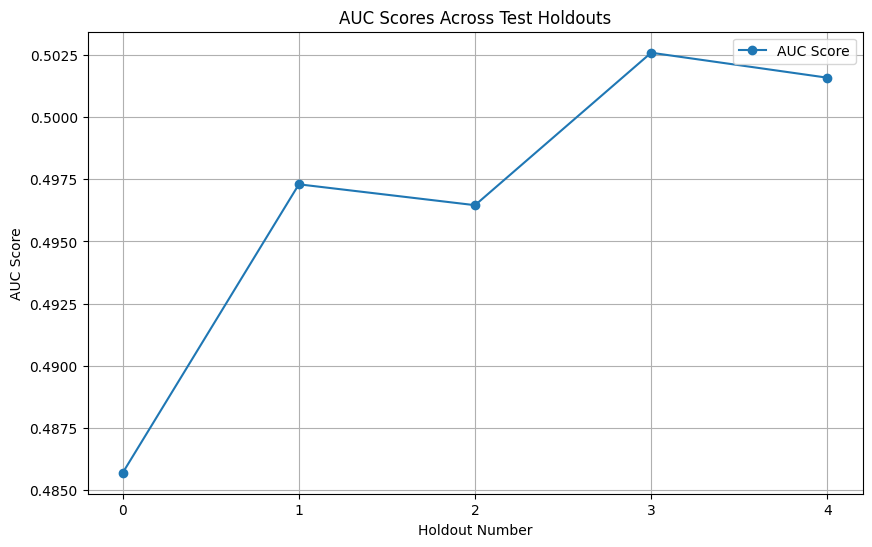

In [39]:
# Plotting AUC Scores for test mode
plt.figure(figsize=(10, 6))
plt.plot(results_df['Holdout'], results_df['AUC'], marker='o', label='AUC Score')
plt.title('AUC Scores Across Test Holdouts')
plt.xlabel('Holdout Number')
plt.ylabel('AUC Score')
plt.xticks(results_df['Holdout'])
plt.grid()
plt.legend()
plt.show()
